# OSSE / Trade Space Capability for NOAA's Future Mission Design

TAT-C Analysis Exampels

Paul T. Grogan <paul.grogan@asu.edu>

## Scenario Definition

Define a scenario starting on September 12, 2024 at 20:00 UTC and running for 90 minutes.

In [19]:
import pandas as pd
from datetime import datetime, timedelta, timezone

start = datetime(2024, 9, 12, 20, 0, tzinfo=timezone.utc)
end = start + timedelta(minutes=90)
times = pd.date_range(start, end, freq=timedelta(minutes=1))

## Satellite Definition

Define satellites for NOAA 20 and NOAA 21 with a generic 100-degree field-of-regard instrument.

In [20]:
from tatc.schemas import Satellite, TwoLineElements, Instrument

noaa20 = Satellite(
    name="NOAA 20",
    orbit=TwoLineElements(
        tle=[
            "1 43013U 17073A   24256.53073306  .00000670  00000+0  33800-3 0  9994",
            "2 43013  98.7093 192.9982 0001348  27.3459 332.7788 14.19586332353297",
        ]
    ),
    instruments=[Instrument(field_of_regard=100)],
)

noaa21 = Satellite(
    name="NOAA 21",
    orbit=TwoLineElements(
        tle=[
            "1 54234U 22150A   24256.56686835  .00000805  00000+0  40274-3 0  9996",
            "2 54234  98.7548 193.4477 0000450 147.2628 212.8576 14.19505208 95375",
        ]
    ),
    instruments=[Instrument(field_of_regard=100)],
)

## Visualize Orbit Tracks

Collect orbit tracks for the two satellites over the scenario period.

In [21]:
from tatc.analysis import collect_orbit_track
from joblib import Parallel, delayed

orbit_tracks = pd.concat(
    Parallel(-1)(
        delayed(collect_orbit_track)(
            satellite=satellite, instrument=satellite.instruments[0], times=times
        )
        for satellite in [noaa20, noaa21]
    ),
    ignore_index=True,
)

display(orbit_tracks)

,time,satellite,instrument,swath_width,valid_obs,geometry
0,2024-09-12 20:00:00+00:00,NOAA 20,Default,2.246764e+06,True,POINT Z (109.24391 72.16158 838967.33735)
1,2024-09-12 20:01:00+00:00,NOAA 20,Default,2.245420e+06,True,POINT Z (104.13554 69.0123 838529.97657)
2,2024-09-12 20:02:00+00:00,NOAA 20,Default,2.243830e+06,True,POINT Z (100.26118 65.75877 838012.51599)
3,2024-09-12 20:03:00+00:00,NOAA 20,Default,2.242026e+06,True,POINT Z (97.2052 62.43718 837425.38403)
4,2024-09-12 20:04:00+00:00,NOAA 20,Default,2.240045e+06,True,POINT Z (94.71301 59.0688 836780.38326)
...,...,...,...,...,...,...
177,2024-09-12 21:26:00+00:00,NOAA 21,Default,2.263959e+06,True,POINT Z (50.88396 -45.64173 844555.08919)
178,2024-09-12 21:27:00+00:00,NOAA 21,Default,2.268355e+06,True,POINT Z (49.46411 -49.09119 845981.22258)
179,2024-09-12 21:28:00+00:00,NOAA 21,Default,2.272615e+06,True,POINT Z (47.87089 -52.52425 847362.83681)
180,2024-09-12 21:29:00+00:00,NOAA 21,Default,2.276687e+06,True,POINT Z (46.05164 -55.93685 848682.41583)


Create an orbit track animation.

In [29]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import cartopy.crs as ccrs
from IPython.display import HTML

fig = plt.figure()
ax = plt.axes(projection=ccrs.Mollweide())


def animate(frame):
    ax.clear()
    orbit_tracks[orbit_tracks.time == times[frame]].plot(
        ax=ax, column="satellite", legend=True, transform=ccrs.PlateCarree()
    )
    ax.coastlines()
    ax.set_global()


ani = animation.FuncAnimation(fig, animate, frames=len(times), interval=50, blit=False)
display(HTML(ani.to_jshtml()))
plt.close()

## Visualize Ground Tracks

Collect ground tracks (projected in UTM coordinate frames) for the two satellites over the scenario period.

In [23]:
from tatc.analysis import collect_ground_track
from joblib import Parallel, delayed

ground_tracks = pd.concat(
    Parallel(-1)(
        delayed(collect_ground_track)(
            satellite=satellite,
            instrument=satellite.instruments[0],
            times=times,
            crs="utm",
        )
        for satellite in [noaa20, noaa21]
    )
)

display(ground_tracks)

,time,satellite,instrument,swath_width,valid_obs,geometry
0,2024-09-12 20:00:00+00:00,NOAA 20,Default,2.246764e+06,True,"POLYGON Z ((136.56909 68.21842 0, 135.01537 67..."
1,2024-09-12 20:01:00+00:00,NOAA 20,Default,2.245420e+06,True,"POLYGON Z ((128.07145 65.29837 0, 126.78659 64..."
2,2024-09-12 20:02:00+00:00,NOAA 20,Default,2.243830e+06,True,"POLYGON Z ((122.35518 62.86208 0, 121.35206 62..."
3,2024-09-12 20:03:00+00:00,NOAA 20,Default,2.242026e+06,True,"POLYGON Z ((116.67641 59.40091 0, 115.79435 58..."
4,2024-09-12 20:04:00+00:00,NOAA 20,Default,2.240045e+06,True,"POLYGON Z ((112.79528 56.58918 0, 112.08634 55..."
...,...,...,...,...,...,...
86,2024-09-12 21:26:00+00:00,NOAA 21,Default,2.263959e+06,True,"POLYGON Z ((64.36827 -43.3502 0, 64.71899 -44...."
87,2024-09-12 21:27:00+00:00,NOAA 21,Default,2.268355e+06,True,"POLYGON Z ((63.92707 -46.77579 0, 64.31963 -47..."
88,2024-09-12 21:28:00+00:00,NOAA 21,Default,2.272615e+06,True,"POLYGON Z ((63.51067 -50.21605 0, 63.95059 -51..."
89,2024-09-12 21:29:00+00:00,NOAA 21,Default,2.276687e+06,True,"POLYGON Z ((62.40949 -52.90032 0, 63.0044 -53...."


Create a ground track animation.

In [30]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import cartopy.crs as ccrs
from IPython.display import HTML

fig = plt.figure()
ax = plt.axes(projection=ccrs.Mollweide())


def animate(frame):
    ax.clear()
    ground_tracks[ground_tracks.time == times[frame]].plot(
        ax=ax, column="satellite", legend=True, transform=ccrs.PlateCarree()
    )
    ax.coastlines()
    ax.set_global()


ani = animation.FuncAnimation(fig, animate, frames=len(times), interval=50, blit=False)
display(HTML(ani.to_jshtml()))
plt.close()

## Perform Revisit Analysis

Collect observations of target points.

In [25]:
from tatc.analysis import (
    collect_observations,
    aggregate_observations,
    reduce_observations,
)
from tatc.generation import generate_fibonacci_lattice_points
from tatc.schemas import Point
import matplotlib.pyplot as plt
from datetime import timedelta
import pandas as pd
from joblib import Parallel, delayed

start = datetime(2024, 9, 11, 20, tzinfo=timezone.utc)
end = start + timedelta(days=20)

points_df = generate_fibonacci_lattice_points(1000e3)
points = points_df.apply(
    lambda r: Point(id=r.point_id, latitude=r.geometry.y, longitude=r.geometry.x),
    axis=1,
)

obs_df = pd.concat(
    Parallel(n_jobs=-1)(
        delayed(collect_observations)(
            point,
            satellite,
            satellite.instruments[0],
            start,
            end,
        )
        for point in points
        for satellite in [noaa20, noaa21]
    ),
    ignore_index=True,
)

# aggregate observations to combine overlapping observations
agg_df = aggregate_observations(obs_df)
# reduce observations to time-averaged statistics for each sample point
red_df = reduce_observations(agg_df)
red_df["revisit_hr"] = red_df.apply(lambda r: r["revisit"] / timedelta(hours=1), axis=1)

Generate a visualization.

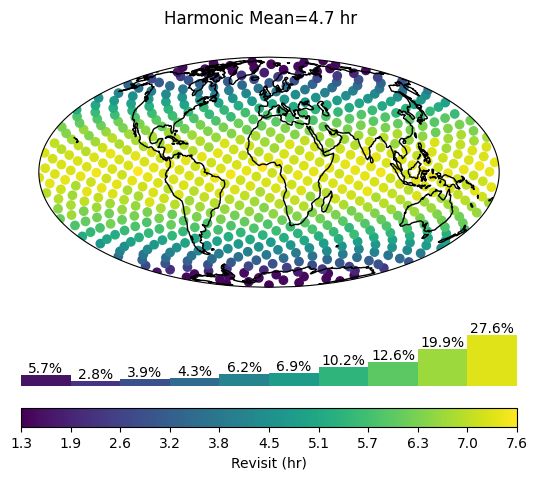

In [26]:
from matplotlib.gridspec import GridSpec
from matplotlib.ticker import StrMethodFormatter
import numpy as np
from scipy import stats

fig = plt.figure()
gs = GridSpec(nrows=3, ncols=1, figure=fig, height_ratios=[3, 1, 0.25])
axs = [
    plt.subplot(gs[0, 0], projection=ccrs.Mollweide()),
    plt.subplot(gs[1, 0]),
    plt.subplot(gs[2, 0]),
]
cmap = plt.colormaps["viridis"]
plt.suptitle(f'Harmonic Mean={stats.hmean(red_df["revisit_hr"]):.1f} hr')

data = red_df["revisit_hr"]
values, bins, bars = axs[1].hist(data, weights=np.ones(len(data)) / len(data))
centers = 0.5 * (bins[:-1] + bins[1:])
colors = (centers - bins.min()) / (bins.max() - bins.min())
for c, p in zip(colors, bars):
    plt.setp(p, "facecolor", cmap(c))
axs[1].bar_label(bars, fmt="{:.1%}")
axs[1].set_xlim(bins.min(), bins.max())
axs[1].set_ylim(0, values.max() * 1.5)
axs[1].axis("off")
red_df.plot(
    ax=axs[0],
    column="revisit_hr",
    cmap=cmap,
    vmin=bins.min(),
    vmax=bins.max(),
    legend=True,
    legend_kwds={
        "label": "Revisit (hr)",
        "orientation": "horizontal",
        "cax": axs[2],
        "ticks": bins,
        "format": StrMethodFormatter("{x:.1f}"),
    },
    transform=ccrs.PlateCarree(),
)
axs[0].coastlines()
axs[0].set_global()
axs[0].set_xlabel("Longitude (deg)")
axs[0].set_ylabel("Latitude (deg)")
plt.show()

## Perform Data Latency Analysis

Collect downlink opportunities.

In [27]:
from tatc.analysis import collect_downlinks, compute_latencies, reduce_latencies
from tatc.schemas import GroundStation

mcmurdo = GroundStation(
    name="McMurdo",
    latitude=-77.846323,
    longitude=166.668235,
    elevation=150,
    min_elevation_angle=5,
)
svalbard = GroundStation(
    name="Svalbard",
    latitude=78.229772,
    longitude=15.407786,
    elevation=450,
    min_elevation_angle=5,
)
fairbanks = GroundStation(
    name="Fairbanks",
    latitude=64.97381,
    longitude=-147.50575,
    elevation=400,
    min_elevation_angle=5,
)
troll = GroundStation(
    name="Troll",
    latitude=-72.016667,
    longitude=2.533333,
    elevation=1275,
    min_elevation_angle=5,
)
white_sands = GroundStation(
    name="White Sands",
    latitude=32.501111,
    longitude=-106.608333,
    elevation=1192,
    min_elevation_angle=5,
)

# parallel process the simulated downlinks for all stations and satellites
dls_db_list = Parallel(n_jobs=-1)(
    delayed(collect_downlinks)(
        station,
        satellite,
        start,
        end,
    )
    for station in [mcmurdo, svalbard, fairbanks, troll, white_sands]
    for satellite in [noaa20, noaa21]
)

# merge the parallel-processed downlink dataframes into a single dataframe
dls_df = pd.concat(dls_db_list, ignore_index=True)
# compute latencies for each observation
lat_df = compute_latencies(obs_df, dls_df)
# reduce latencies to time-averaged statistics for each sample point
lat_red_df = reduce_latencies(lat_df)
lat_red_df["latency_min"] = lat_red_df.apply(
    lambda r: r["latency"] / timedelta(minutes=1), axis=1
)

Generate a visualization.

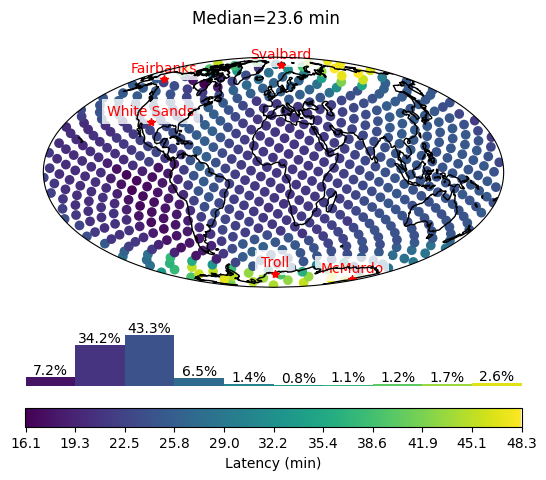

In [28]:
# generate the figure
fig = plt.figure()
gs = GridSpec(nrows=3, ncols=1, figure=fig, height_ratios=[3, 1, 0.25])
axs = [
    plt.subplot(gs[0, 0], projection=ccrs.Mollweide()),
    plt.subplot(gs[1, 0]),
    plt.subplot(gs[2, 0]),
]
cmap = plt.colormaps["viridis"]
plt.suptitle(f'Median={lat_red_df["latency_min"].median():.1f} min')
data = lat_red_df["latency_min"]
values, bins, bars = axs[1].hist(data, weights=np.ones(len(data)) / len(data))
centers = 0.5 * (bins[:-1] + bins[1:])
colors = (centers - bins.min()) / (bins.max() - bins.min())
for c, p in zip(colors, bars):
    plt.setp(p, "facecolor", cmap(c))
axs[1].bar_label(bars, fmt="{:.1%}")
axs[1].set_xlim(bins.min(), bins.max())
axs[1].set_ylim(0, values.max() * 1.5)
axs[1].axis("off")
lat_red_df.plot(
    ax=axs[0],
    column="latency_min",
    cmap=cmap,
    vmin=bins.min(),
    vmax=bins.max(),
    legend=True,
    legend_kwds={
        "label": "Latency (min)",
        "orientation": "horizontal",
        "cax": axs[2],
        "ticks": bins,
        "format": StrMethodFormatter("{x:.1f}"),
    },
    transform=ccrs.PlateCarree(),
)
for station in [mcmurdo, svalbard, fairbanks, troll, white_sands]:
    axs[0].plot(station.longitude, station.latitude, "r*", transform=ccrs.PlateCarree())
    a = axs[0].annotate(
        station.name,
        xy=(station.longitude, station.latitude),
        xycoords="data",
        xytext=(0, 5),
        textcoords="offset points",
        horizontalalignment="center",
        color="r",
        transform=ccrs.PlateCarree(),
        zorder=1,
    )
    a.set_bbox(dict(facecolor="white", alpha=0.8, linewidth=0))
axs[0].coastlines()
axs[0].set_global()
axs[0].set_xlabel("Longitude (deg)")
axs[0].set_ylabel("Latitude (deg)")
plt.show()